# Introduction

Introducing the fundamental concepts of digital image processing, which is a critical foundation for computer vision algorithms, including AI vision applications.

Computer vision is a rapidly developing field of study that involves analyzing and processing digital images to extract useful information. This has led to the development of various artificial intelligence (AI) applications that have proven to be useful in different sectors, such as healthcare, transportation, and security.

The project comprises of two parts. The first part involves loading a supplied script and running it on Google Colab. The script includes several tasks, such as loading an image, performing image segmentation, and image filtering.

The second part of the project involves an experiment with a Deep Learning model implemented using the Keras framework. The experiment entails training a model to classify handwritten digits and evaluating its performance by calculating accuracy metrics. I will be changing the number of training epochs, getting new results, including new accuracy, and visualizing and reflecting on the results with the original number of epochs. I will also explore alternatives to the default model parameters, such as loss, optimizer, and metrics, experiment with the alternatives, visualize and report the results, and interpret them.

# Part 1


##Step1: Load the Dependencies

> This section loads some required libraries used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **PIL**, **matplotlib**

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

##Step2: Read Image from Urls

> In this step we will read images from urls, and display them using openCV, please note the difference when reading image in RGB and BGR format. The default input color channels are in BGR format for openCV.

RGB?

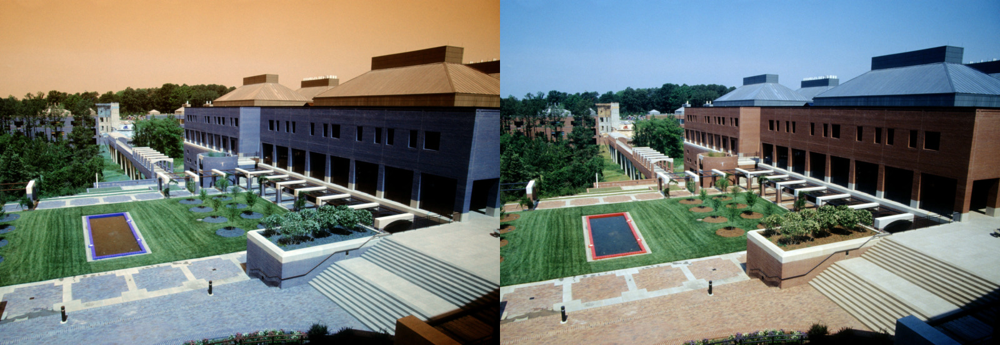

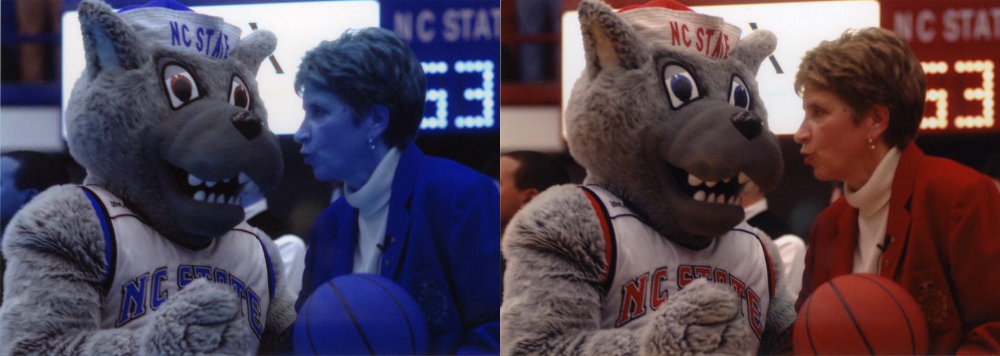

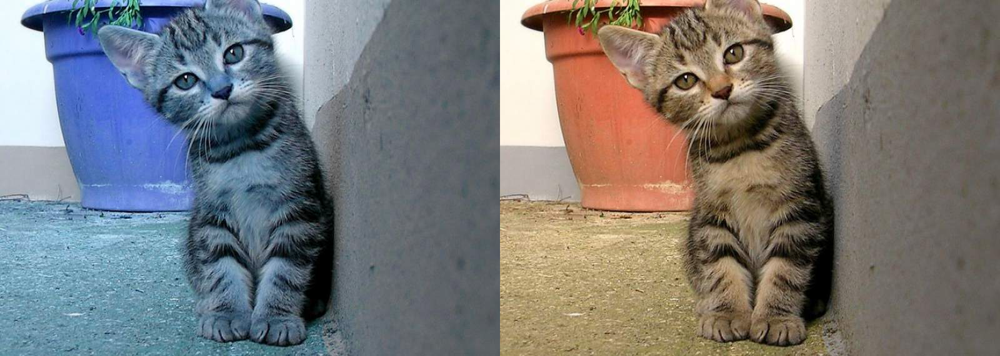

In [ ]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/571"]  
# Read and display the image
# loop over the image URLs, you could store several image urls in the list

for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

#### TODO #1: Read an image from a URL and display it

Image source examples:

[Place Kitten](https://placekitten.com/) - use the base Place Kitten URL followed by a width and height separated by backslashes ''/''. For example, use the URL `https://placekitten.com/500/300` to fetch a cat image with a width of 500px and height of 300px.

[NC State University Libraries Special Collections](https://d.lib.ncsu.edu/collections/catalog) - browse the site to find an image thumbnail. Right-click on the thumbnail and select "Copy Image Address". The address will look like this: `https://iiif.lib.ncsu.edu/iiif/0051230/square/300,/0/default.jpg`. Replace the word "square" with the word "full" and replace "300" with "800" to access the full image at a width of 800px.

[Google Image search](https://www.google.com/imghp?hl=en) - search for an image. Left-click one of the returned images, then right-click on the full image, and then select "Copy Image Address".

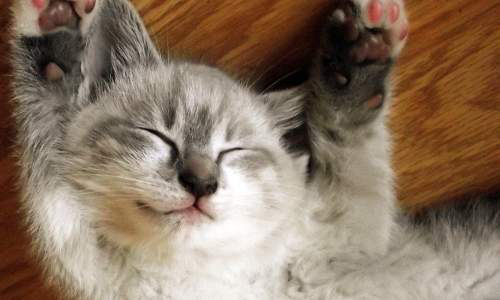

In [ ]:
## TODO: LOAD IMAGE
url = 'https://placekitten.com/500/300'
myImg = io.imread(url)  
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))


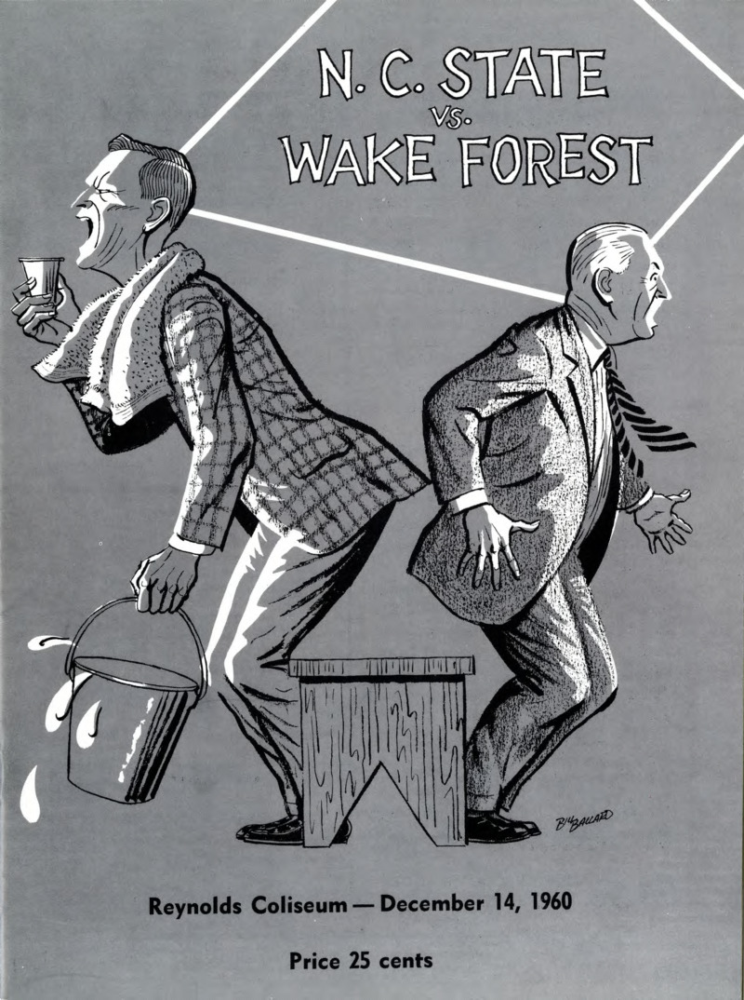

In [ ]:
## TODO: LOAD IMAGE
url = 'https://iiif.lib.ncsu.edu/iiif/ua015_010-004-bx0046-025-004_0001/full/800,/0/default.jpg'
myImg = io.imread(url)  
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))

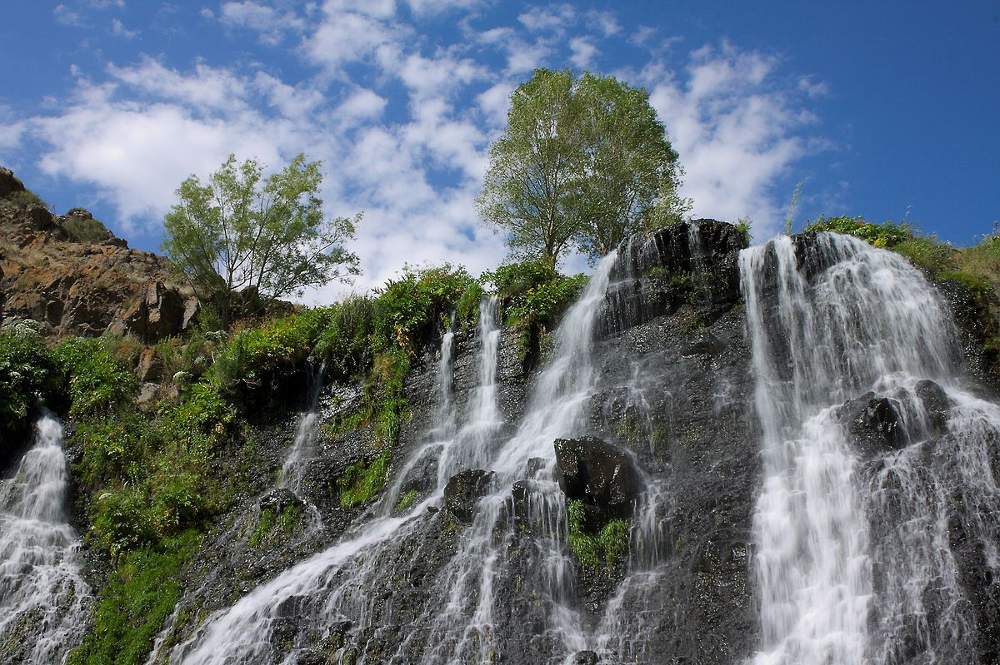

In [ ]:
## TODO: LOAD IMAGE
url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/42/Shaqi_jrvej.jpg/1200px-Shaqi_jrvej.jpg'
myImg = io.imread(url)  
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))

##Step3: Image Contours and Histograms

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
571
800
3


### Generate Histogram of color image and grayscale image
Sometimes you want to enhance the contrast in your image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much, or don’t matter. A good tool to find interesting regions is the histogram. To create a histogram of our image data, we use the matplot.pylab `hist()` function.

More info: [Histogram](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_table_of_contents_histograms/py_table_of_contents_histograms.html)

Display the histogram of all the pixels in the color image

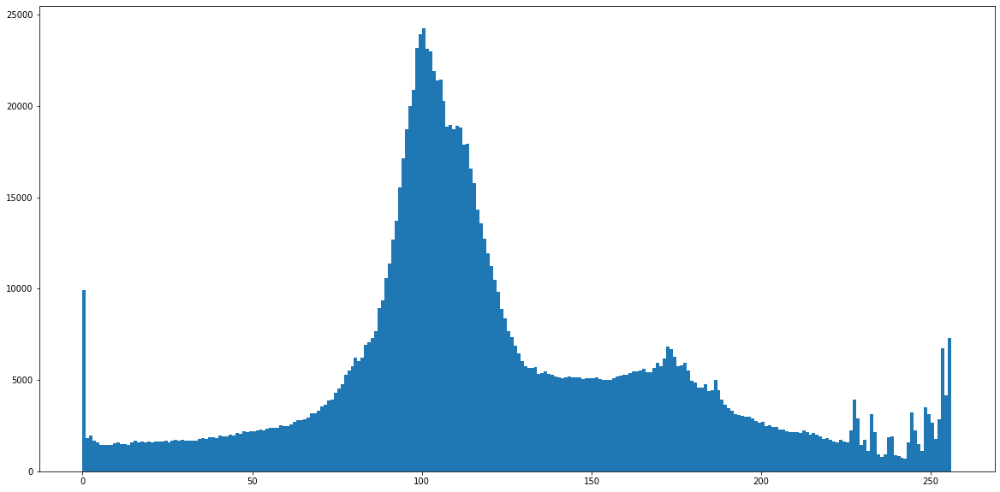

In [ ]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

Display the histogram of R, G, B channel
We could observe that the green channel has many pixels in 255, which represents the white patch in the image

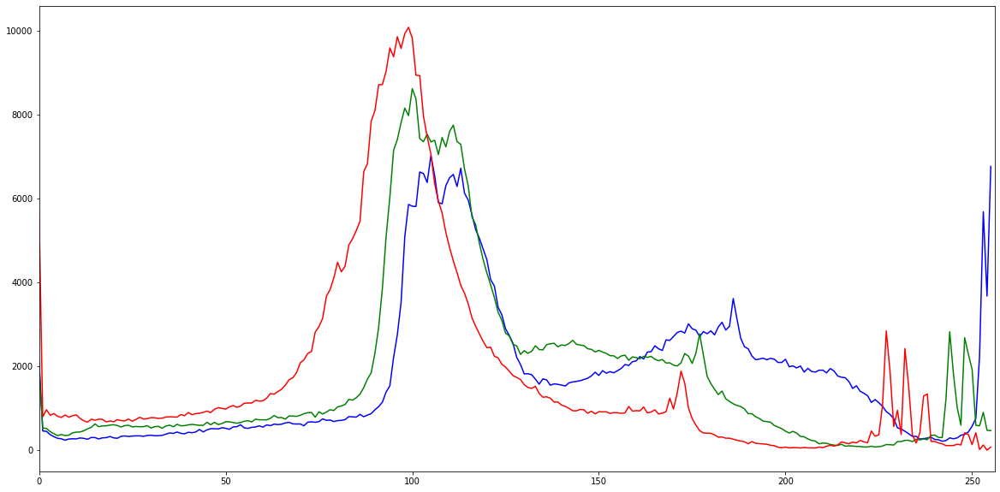

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

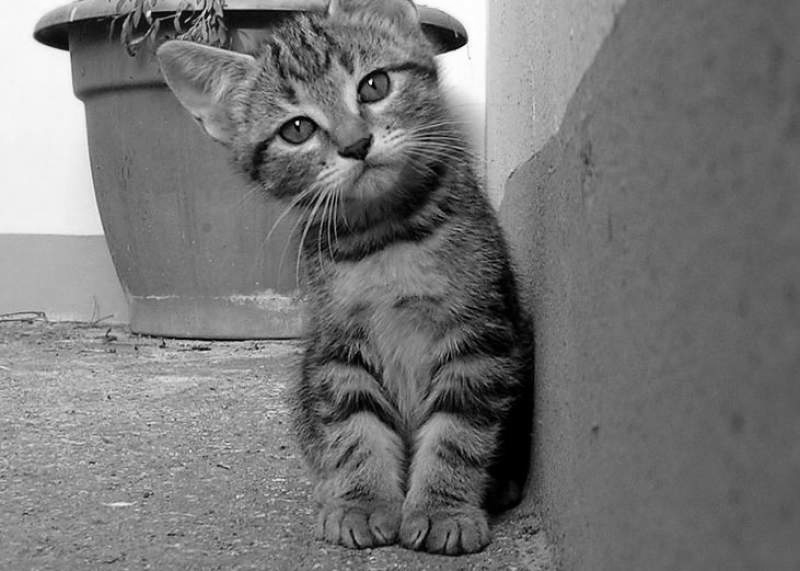

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

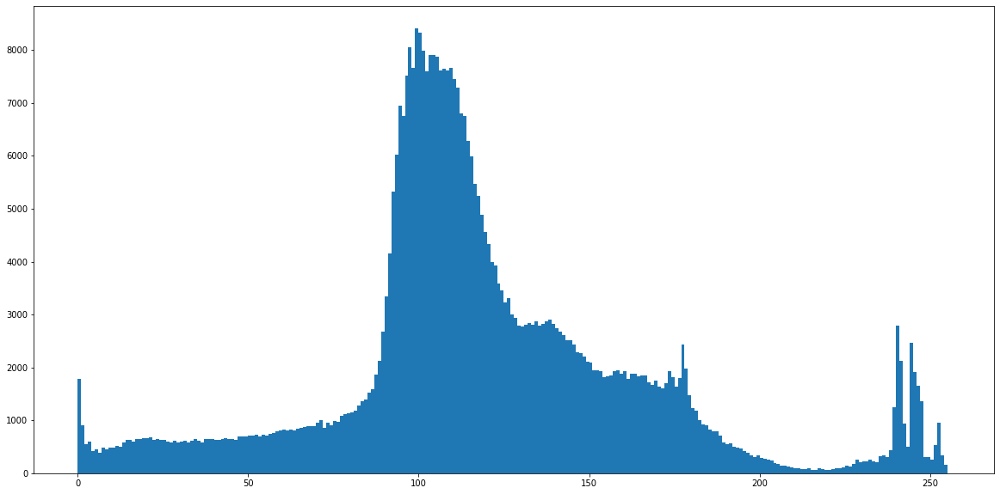

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

 #### TODO # 2: DISPLAY THE GRAYSCALE OF YOUR COLOR IMAGE AND GENERATE HISTOGRAM


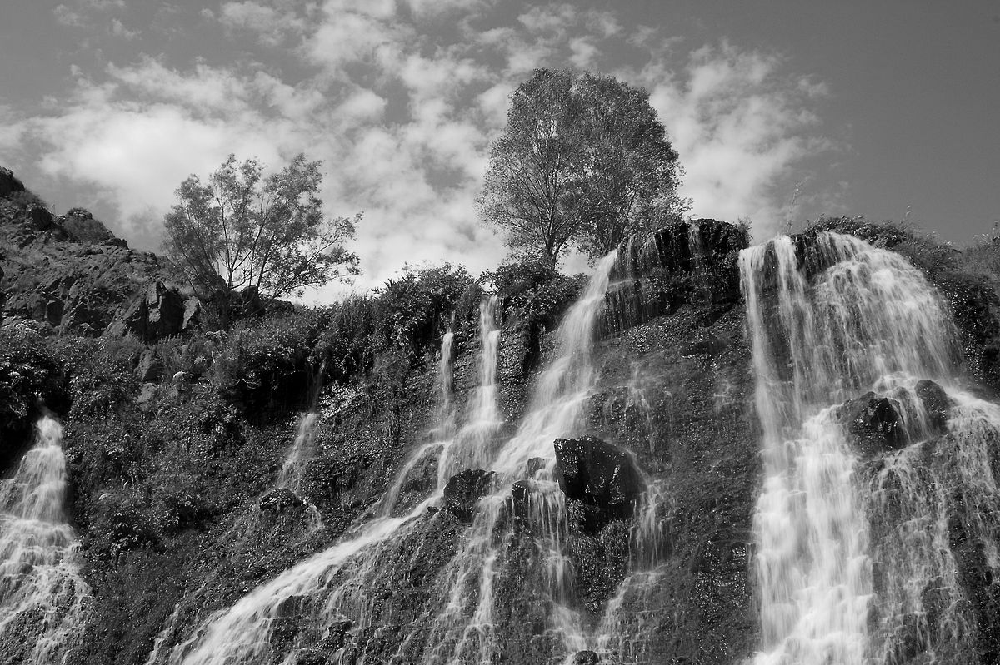

In [ ]:
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv2_imshow(myGrayImg)

### Find image contour of the grayscale image

Method 1: Use the matplotlib. contour

More Info: [matplotlib contour](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contour.html)

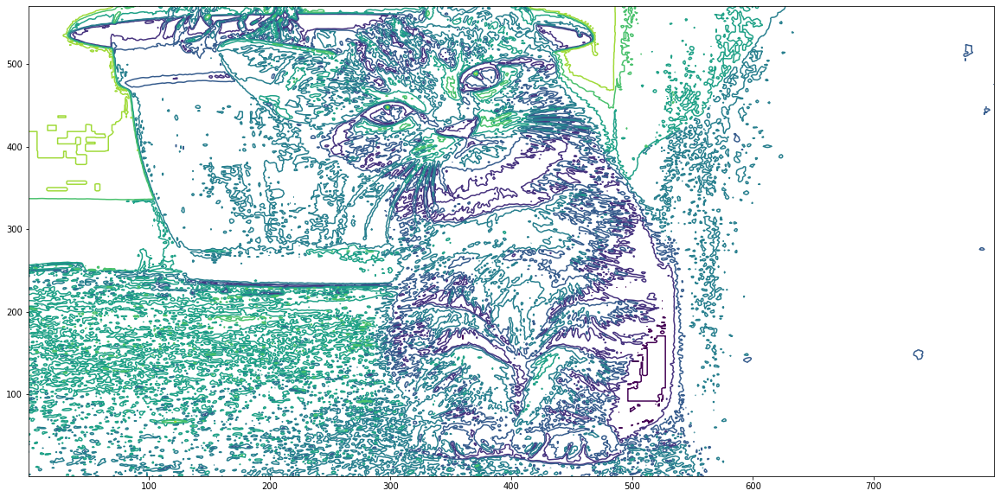

In [ ]:
plt.contour(gray_image, origin = "image")

Method 2: Use the openCV lib

More info: [Contour](https://docs.opencv.org/3.1.0/d4/d73/tutorial_py_contours_begin.html)

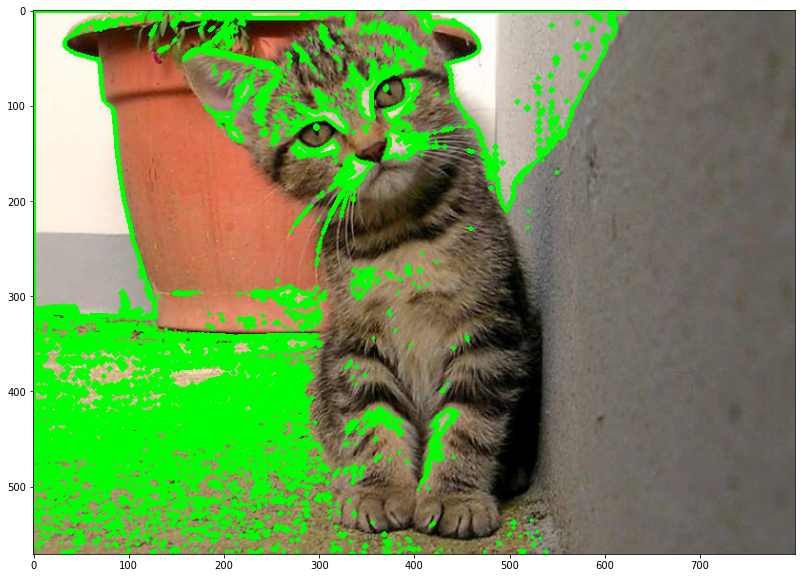

In [ ]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(gray_image,150,255,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

#### TODO # 3: Find the contour of your own image

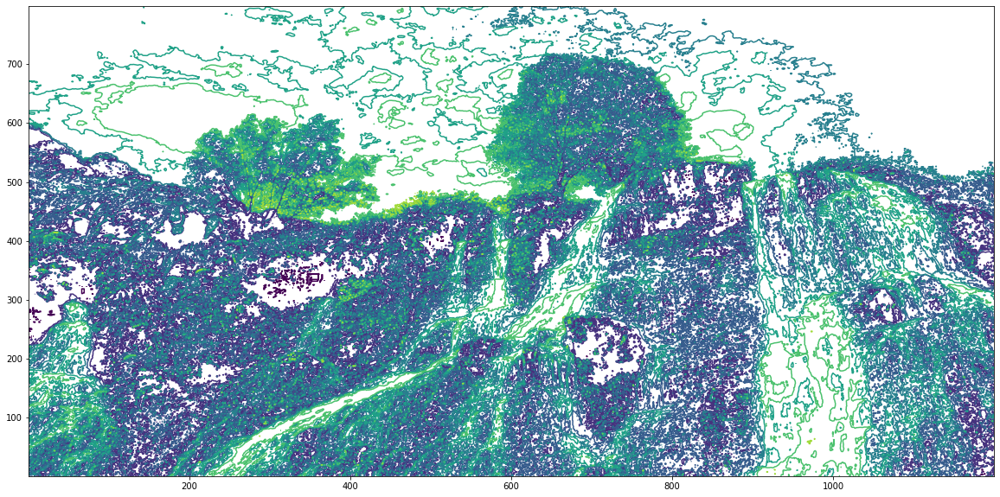

In [ ]:
# Your code
plt.contour(myGrayImg, origin = "image")

##Step4: Grayscale Transform and Histogram Equalization


### Grayscale Transformation
This section provides some examples of conducting mathematical transformations of the grayscale image

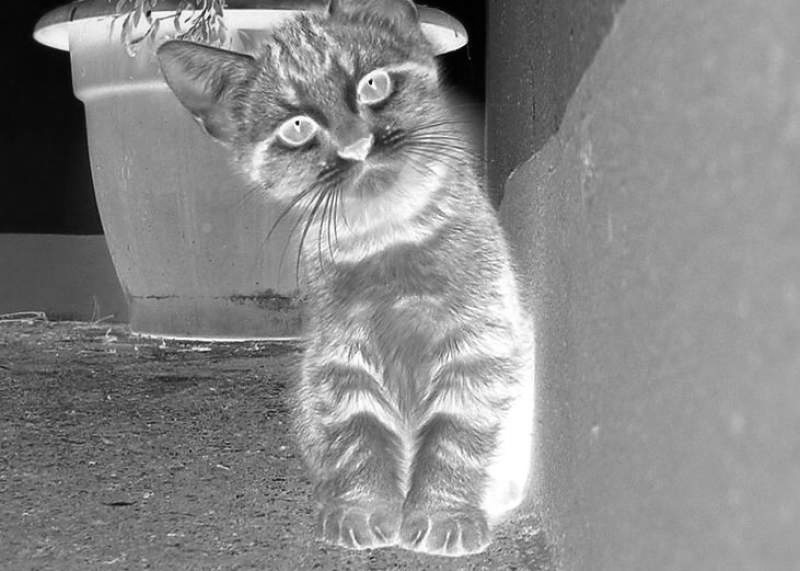

In [ ]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

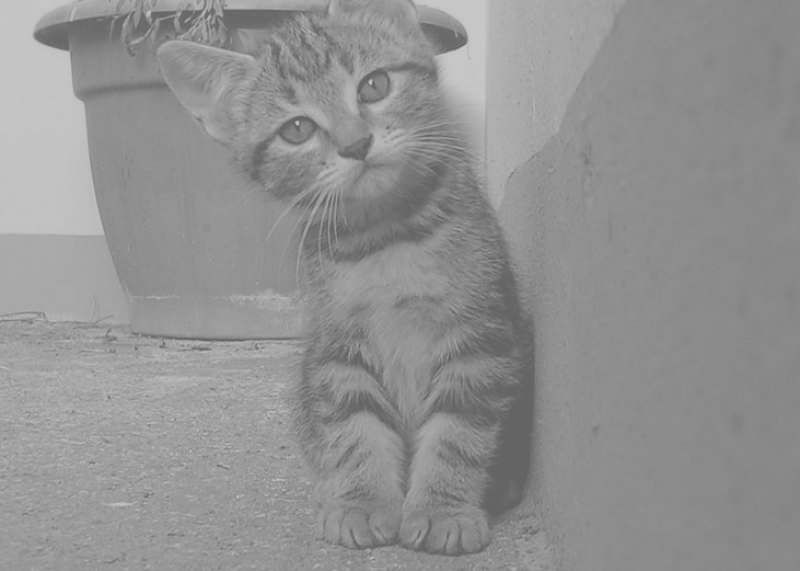

In [ ]:
# Another transform of the image, after adding a constant, 
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

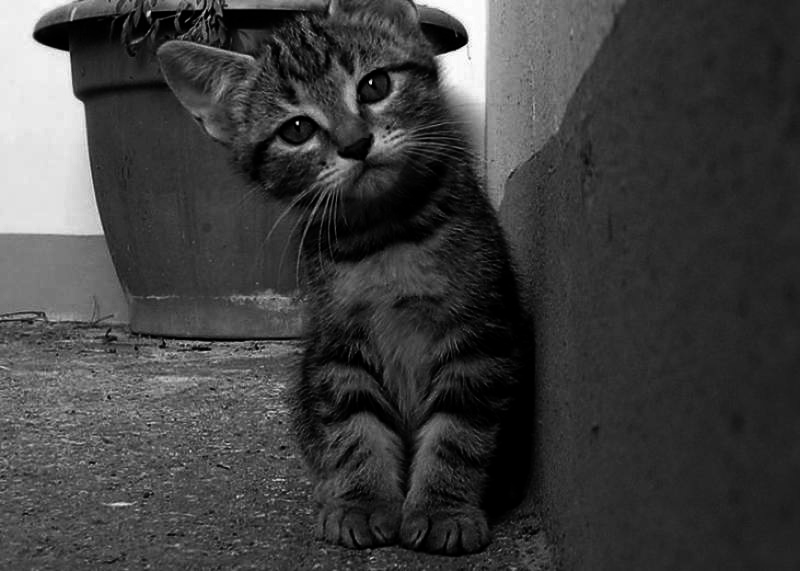

In [ ]:
# The lightness level of the gray_image decreases after this step
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

#### TODO #4:  Try some mathematical operations on your image

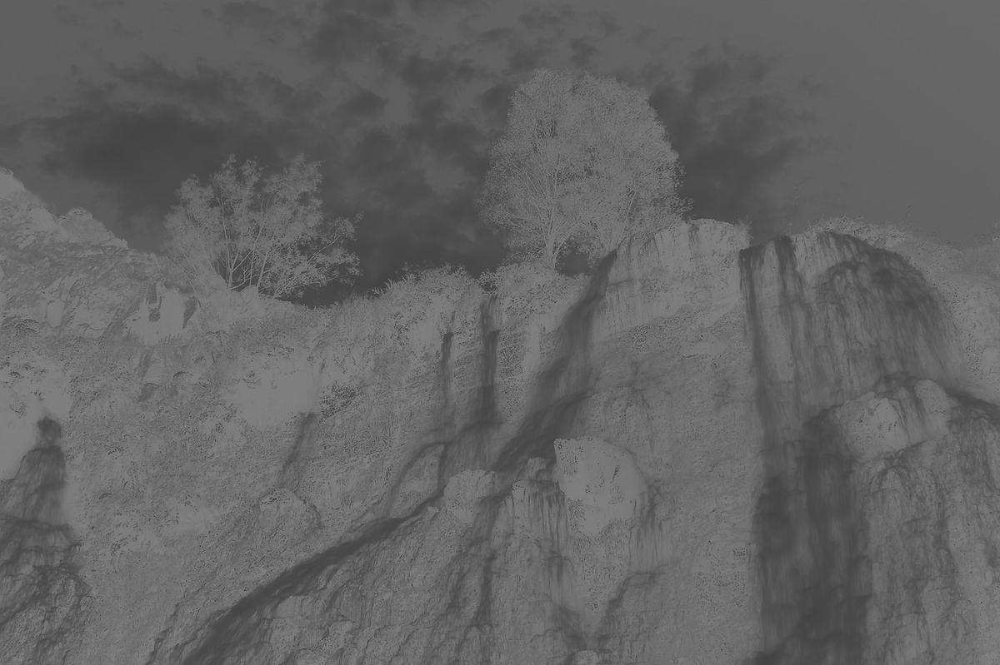

In [ ]:
## Implement your code here
myGrayImgTrans = (255 - (myGrayImg/2))/2
cv2_imshow(myGrayImgTrans)

### Histogram Equalization
This section demonstrates histogram equalization on a dark image. This transform flattens the gray-level histogram so that all intensities are as equally common as possible. The transform function is a cumulative distribution function (cdf) of the pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses image 4 (im4).

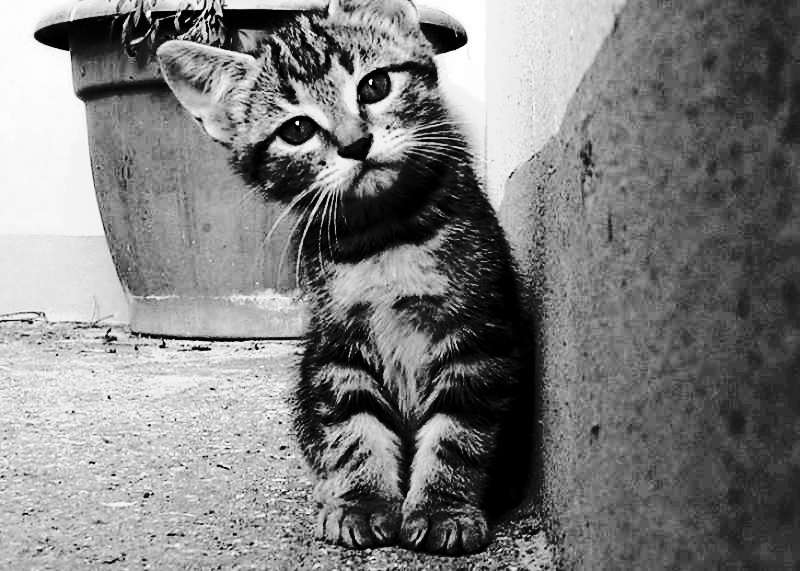

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)

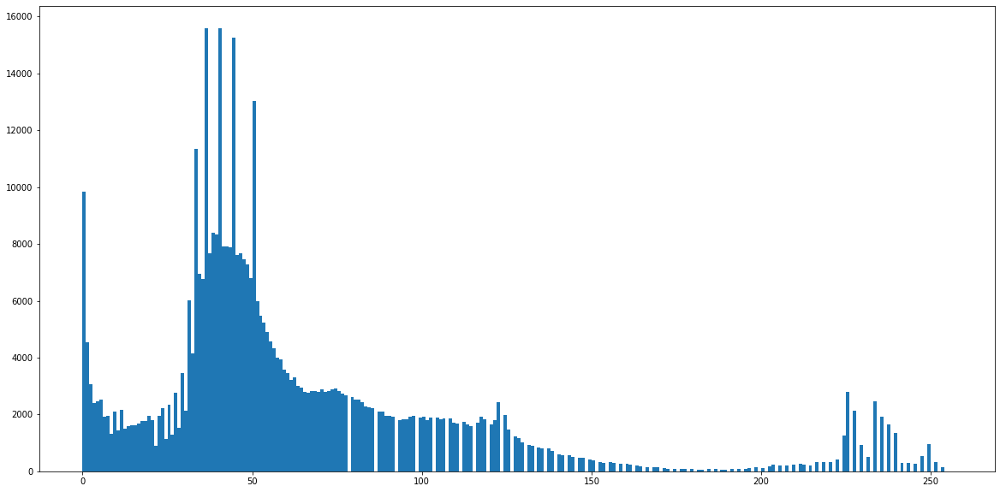

In [ ]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(),bins = 256, range = [0, 256])
plt.show()

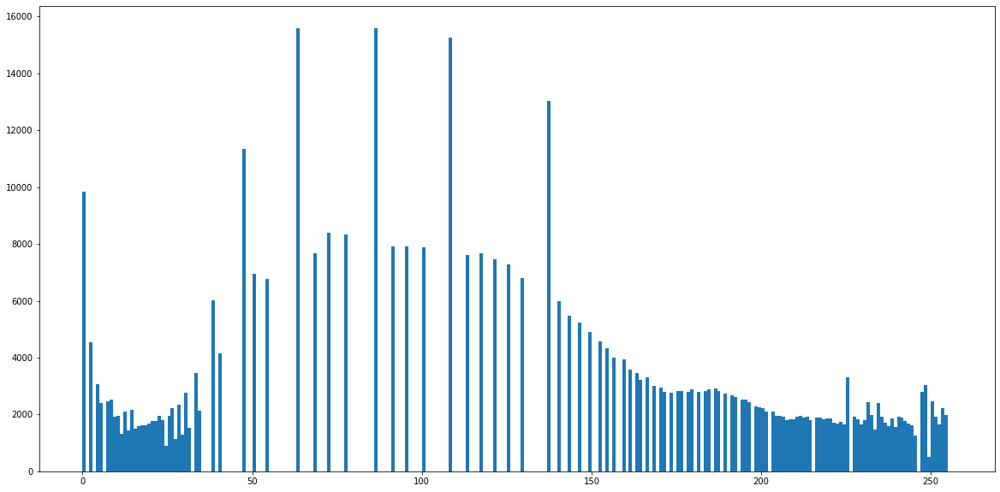

In [ ]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

#### TODO # 5: Do a histogram equalization on your grayscale image



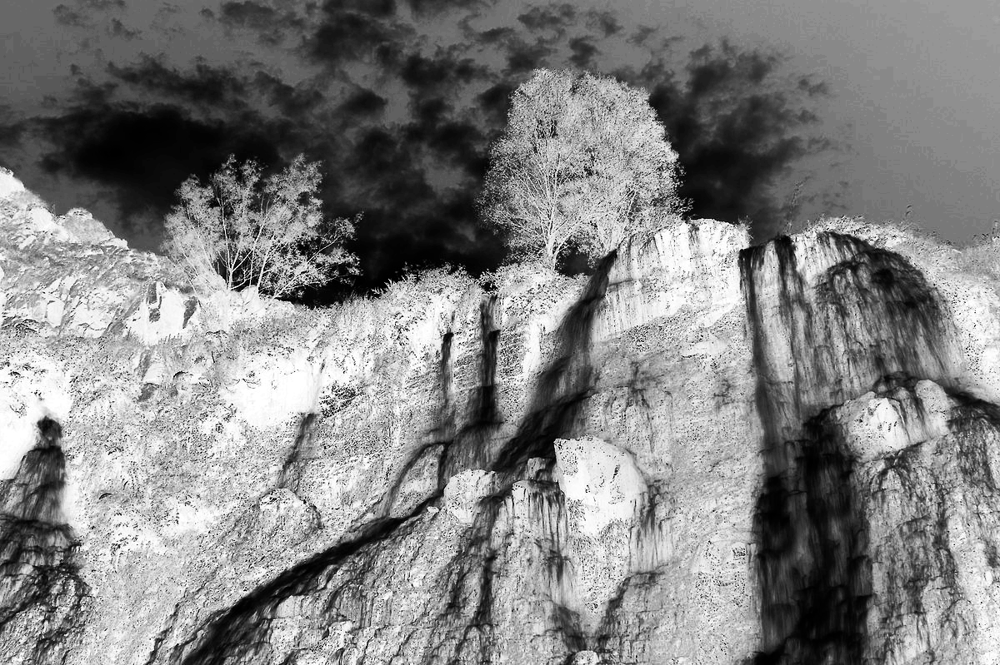

(array([ 2611.,  2095.,  3974.,  5793.,     0.,  8086.,     0.,     0.,
         8815.,     0.,  9756.,     0.,     0., 11526.,     0.,     0.,
            0., 12710.,     0.,     0.,     0., 13928.,     0.,     0.,
        14335.,     0.,     0.,     0., 14294.,     0.,     0.,     0.,
        15236.,     0.,     0.,     0., 15250.,     0.,     0.,     0.,
        14961.,     0.,     0.,     0., 14645.,     0.,     0.,     0.,
        13901.,     0.,     0.,     0., 14000.,     0.,     0., 14339.,
            0.,     0.,     0., 15175.,     0.,     0.,     0.,     0.,
        15727.,     0.,     0.,     0., 16062.,     0.,     0.,     0.,
            0., 17428.,     0.,     0.,     0.,     0., 18816.,     0.,
            0.,     0., 18591.,     0.,     0.,     0.,     0.,     0.,
        21355.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
        29781.,     0.,     0.,     0.,     0.,     0.,     0., 24557.,
            0.,     0.,     0., 18332.,     0.,     0.,     0., 

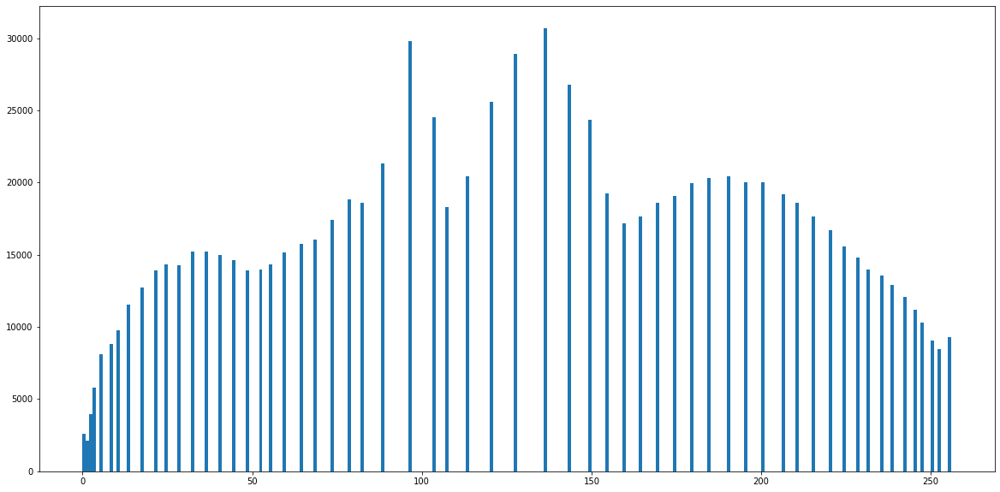

In [ ]:
## TODO: IMPLEMENT YOUR CODE HERE
## CODE INSTRUCTION
myGrayImgTrans_hist = histeq(myGrayImgTrans)
cv2_imshow(myGrayImgTrans_hist)
plt.hist(myGrayImgTrans_hist.ravel(),bins = 256, range = [0, 256])

##Step5: Fourier Transform of Gray Images
[FFT](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html)
> A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

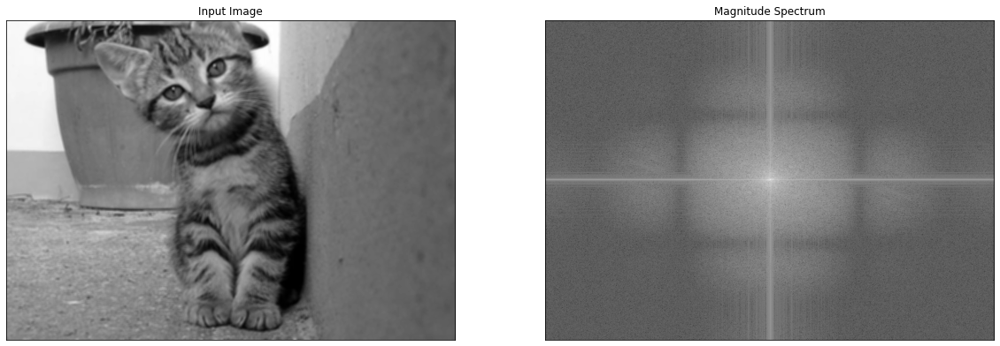

In [ ]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

### TODO # 6: Generate a fourier transform of your grayscale image

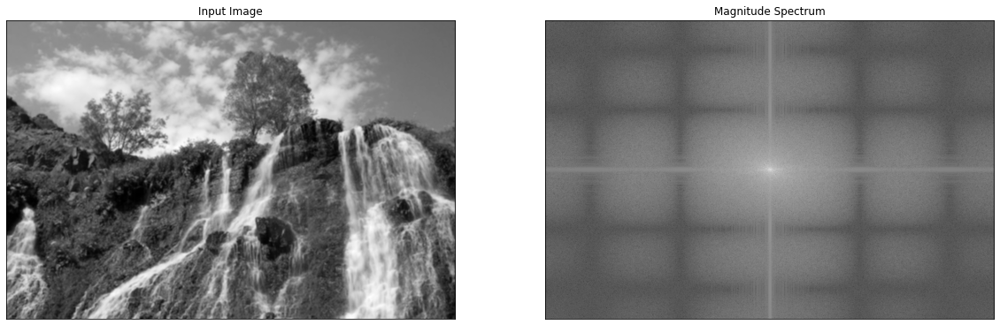

In [ ]:
# todo: Implement your code here
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(myGrayImg,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

## Step6: Finding Edges by Highpass Filtering in FFT

This section demonstrates conducting a high pass filter to remove the low frequency component, resulting in a sharpened image which contains the edges

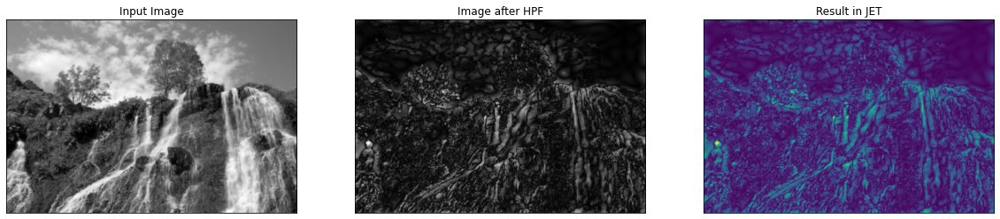

In [ ]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

# Conclusions / Comments

This is a notebook for an image processing workshop using the OpenCV computer vision library and some standard data analysis libraries in Python. The workshop covers basic image processing techniques.

The first step is to load the required libraries, including numpy, pandas, cv2, skimage, PIL, and matplotlib. Next, images are read from URLs, and displayed using OpenCV. The workshop provides examples of URLs for images from different sources, such as Place Kitten, NC State University Libraries Special Collections, and Google Image search.

The third step covers generating histograms of color and grayscale images to enhance the contrast in an image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much or don’t matter. The histogram is a good tool for finding interesting regions in an image. The workshop provides examples of how to display the histogram of all the pixels in a color image, as well as the histogram of the R, G, and B channels. Additionally, the workshop covers how to generate a histogram for a grayscale image.

# Part 2

# MNIST Classification Using *Convolutional Neural Network*
---
- Author: Vladimir Shapiro, adopted from Diego Inácio's
- Notebook: [MNIST_classification.ipynb](https://github.com/diegoinacio/computer-vision-notebooks/blob/master/Computer-Vision-Experiments/MNIST_classification.ipynb)
---
Digit classification using *Convolutional Neural Network*.

In [ ]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import tensorflow as tf

## Read the dataset
---

In [ ]:
mnist = tf.keras.datasets.mnist
[X_train, Y_train],[X_test, Y_test] = mnist.load_data()
X_train = X_train[..., None]
X_test = X_test[..., None]

# one hot for multi-class classification
# MNIST = 10 classes [0-9]
Y_train_oh = np.zeros((Y_train.size, 10))
Y_train_oh[np.arange(Y_train.size), Y_train] = 1
Y_test_oh = np.zeros((Y_test.size, 10))
Y_test_oh[np.arange(Y_test.size), Y_test] = 1

print('X_train:', X_train.shape)
print('Y_train:', Y_train.shape)
print('Y_train_oh:', Y_train_oh.shape)
print('X_test:', X_test.shape)
print('Y_test:', Y_test.shape)
print('Y_test_oh:', Y_test_oh.shape)

X_train: (60000, 28, 28, 1)
Y_train: (60000,)
Y_train_oh: (60000, 10)
X_test: (10000, 28, 28, 1)
Y_test: (10000,)
Y_test_oh: (10000, 10)


Display several randomly selected handwritten digits to provide a raw impression how the digits look like.

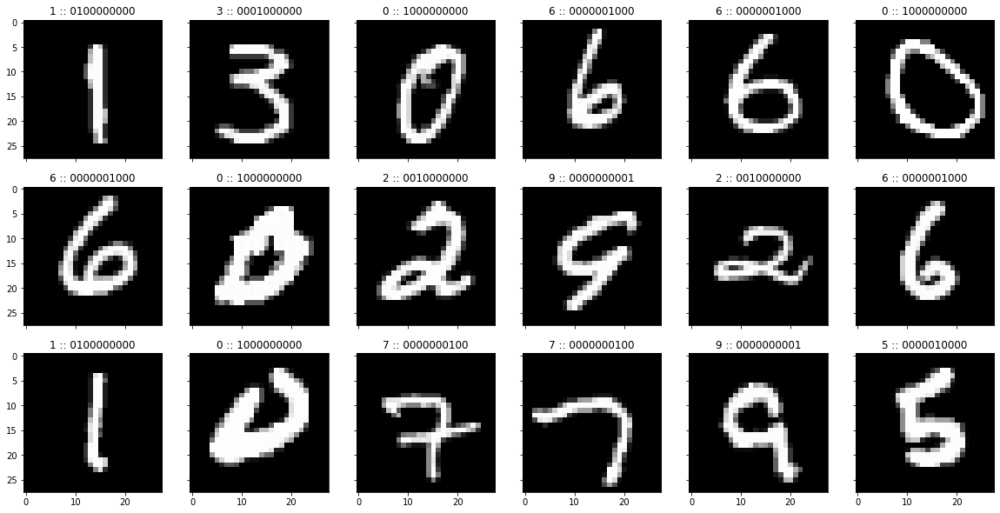

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
fig, AX = plt.subplots(3, 6, sharex=True, sharey=True)

np.random.seed(1234)
for ax in AX.ravel():
    rindex = np.random.randint(Y_train.size)
    img_show = X_train[rindex][...,0]
    ax.imshow(img_show, cmap='gray')
    # title label + one-hot
    title = f'{Y_train[rindex]} :: '
    title += ''.join([str(int(e)) for e in Y_train_oh[rindex]]) 
    ax.set_title(title)
plt.grid(False)

## Transform dataset
---

To a format suitable for the training and predictions later on. A separate *X_test* dataset is allocated.

In [ ]:
# Change dtype to float32
X_train = X_train.astype(np.float32)
Y_train = Y_train.astype(np.float32)
X_test = X_test.astype(np.float32)
Y_test = Y_test.astype(np.float32)

# Change axes and normalization
X_train, Y_train = X_train/255, Y_train.reshape(-1, 1)
X_test, Y_test = X_test/255, Y_test.reshape(-1, 1)

# reshape Xs
x_train = X_train.reshape(-1, 28*28)
x_test = X_test.reshape(-1, 28*28)

print('X_train:', X_train.shape)
print('x_train:', x_train.shape)
print('Y_train:', Y_train.shape)
print('Y_train_oh:', Y_train_oh.shape)
print('X_test:', X_test.shape)
print('x_test:', x_test.shape)
print('Y_test:', Y_test.shape)
print('Y_test_oh:', Y_test_oh.shape)

X_train: (60000, 28, 28, 1)
x_train: (60000, 784)
Y_train: (60000, 1)
Y_train_oh: (60000, 10)
X_test: (10000, 28, 28, 1)
x_test: (10000, 784)
Y_test: (10000, 1)
Y_test_oh: (10000, 10)


# Classification using *Convolutional Neural Network (CNN)*
---

## Training

Create Keras' Sequential CNN model, which is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor.

First, define the *structure* or *architecture* of the CNN model:

In [ ]:
# Get dimensions
N1, N2, C = X_train[0].shape

# Model
modelCNN = tf.keras.Sequential([
    tf.keras.layers.Input(X_train[0].shape),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(N1*N2, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation='softmax')
])

modelCNN.summary() # Display the structure

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 conv2d_5 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 12, 12, 64)       0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 12, 12, 64)        0         
                                                                 
 flatten_2 (Flatten)         (None, 9216)              0         
                                                                 
 dense_4 (Dense)             (None, 784)               7226128   
                                                      

Now, *build* the actual model, that is allocate computer memory, connections, hyperparameters, etc. per definitions above.

In [ ]:
modelCNN.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

Begin the CNN training for a given number of epochs. 
    
    Tip: Training on a conventional CPU is significantly slower than on GPU/TPU. To request that go to "Runtime" -> "Change Runtime Type" and select "GPU" from the dropdown list prior to running the script.

In [ ]:
NUMBER_OF_EPOCHS = 10
modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/10
1875/1875 [==============================] - 13s 6ms/step - loss: 0.1231 - accuracy: 0.9613
Epoch 2/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0484 - accuracy: 0.9844
Epoch 3/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0366 - accuracy: 0.9884
Epoch 4/10
1875/1875 [==============================] - 12s 7ms/step - loss: 0.0290 - accuracy: 0.9905
Epoch 5/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0220 - accuracy: 0.9928
Epoch 6/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0185 - accuracy: 0.9944
Epoch 7/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0150 - accuracy: 0.9949
Epoch 8/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0145 - accuracy: 0.9952
Epoch 9/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0126 - accuracy: 0.9959
Epoch 10/10
1875/1875 [==============================] - 11s 6ms/step - l

## Testing

Now, we have the trained model and can do predictions.

313/313 [==============================] - 1s 2ms/step


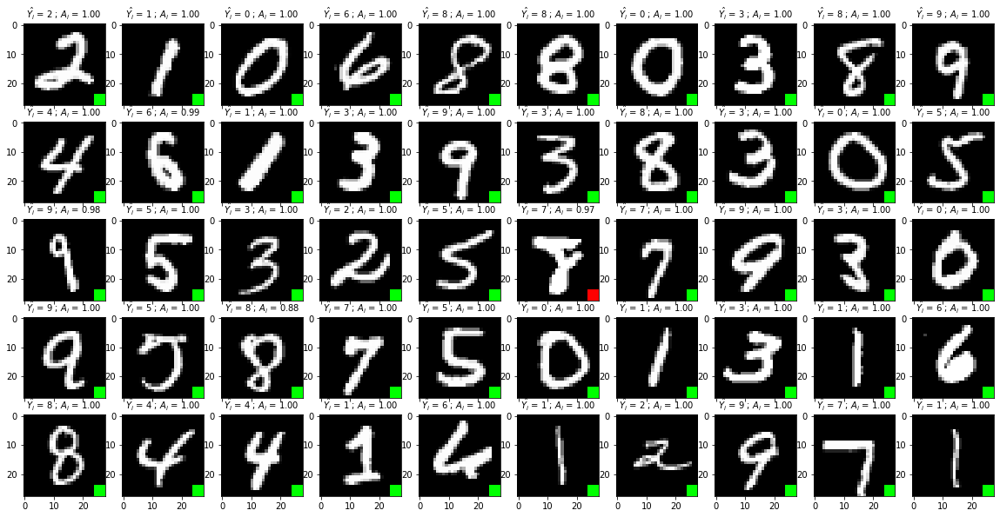

In [ ]:
fig, AX = plt.subplots(5, 10, sharex=True)
AX = [b for a in AX for b in a]

prediction_on_test = modelCNN.predict(X_test)

np.random.seed(1234)
for ax in AX:
    index = np.random.randint(Y_test.size)
    # Predict
    A_ = prediction_on_test[index]
    Y_ = np.argmax(A_)
    # Prepare image to show
    img_show = np.ones((N1, N2, 3))
    img_show *= X_test[index]
    # Green square: classified correctly
    # Red square: classified wrongly
    if Y_ == Y_test[index]:
        img_show[-4:, -4:] = (0, 1, 0)
    else:
        img_show[-4:, -4:] = (1, 0, 0)
    ax.imshow(img_show)
    ax.set_title(r'$\hat{Y_i}$ = ' + str(Y_) + r' ; $A_i$ = {:.02f}'.format(float(A_[Y_])), fontsize=10)

Calculate a validation metric as:

In [ ]:
print('Validation')
#prediction_on_test = modelCNN.predict(X_test)
print('Test:', np.sum((Y_test_oh - prediction_on_test)**2, axis=1).mean())

prediction_on_train = modelCNN.predict(X_train)
print('Train:', np.sum((Y_train_oh - prediction_on_train)**2, axis=1).mean())

Validation
Test: 0.014125062240255547
1875/1875 [==============================] - 4s 2ms/step
Train: 0.0009675720828110518


### Changing the number of epochs

8 epochs

In [ ]:
NUMBER_OF_EPOCHS = 8
modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0106 - accuracy: 0.9964
Epoch 2/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0088 - accuracy: 0.9974
Epoch 3/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0098 - accuracy: 0.9969
Epoch 4/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0098 - accuracy: 0.9969
Epoch 5/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0082 - accuracy: 0.9974
Epoch 6/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0079 - accuracy: 0.9976
Epoch 7/8
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0083 - accuracy: 0.9975
Epoch 8/8
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0071 - accuracy: 0.9979


## Testing

Now, we have the trained model and can do predictions (with 8 EPOCHS).

313/313 [==============================] - 1s 2ms/step


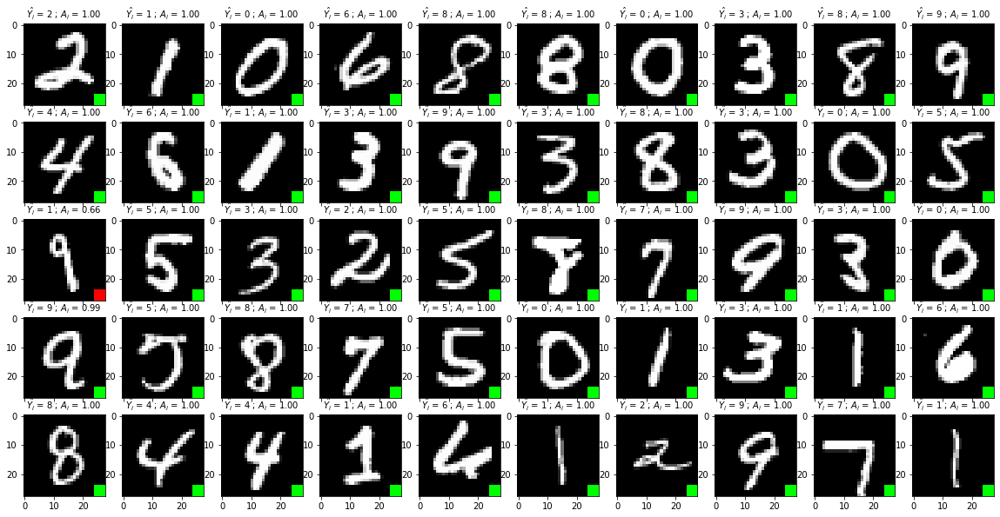

In [ ]:
fig, AX = plt.subplots(5, 10, sharex=True)
AX = [b for a in AX for b in a]

prediction_on_test = modelCNN.predict(X_test)

np.random.seed(1234)
for ax in AX:
    index = np.random.randint(Y_test.size)
    # Predict
    A_ = prediction_on_test[index]
    Y_ = np.argmax(A_)
    # Prepare image to show
    img_show = np.ones((N1, N2, 3))
    img_show *= X_test[index]
    # Green square: classified correctly
    # Red square: classified wrongly
    if Y_ == Y_test[index]:
        img_show[-4:, -4:] = (0, 1, 0)
    else:
        img_show[-4:, -4:] = (1, 0, 0)
    ax.imshow(img_show)
    ax.set_title(r'$\hat{Y_i}$ = ' + str(Y_) + r' ; $A_i$ = {:.02f}'.format(float(A_[Y_])), fontsize=10)

Calculate a validation metric as:

In [ ]:
print('Validation')
#prediction_on_test = modelCNN.predict(X_test)
print('Test:', np.sum((Y_test_oh - prediction_on_test)**2, axis=1).mean())

prediction_on_train = modelCNN.predict(X_train)
print('Train:', np.sum((Y_train_oh - prediction_on_train)**2, axis=1).mean())

Validation
Test: 0.01995398992428077
1875/1875 [==============================] - 4s 2ms/step
Train: 0.0018250647295290404


12 epochs.

In [ ]:
NUMBER_OF_EPOCHS = 12
modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0073 - accuracy: 0.9979
Epoch 2/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0079 - accuracy: 0.9979
Epoch 3/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0076 - accuracy: 0.9980
Epoch 4/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0069 - accuracy: 0.9980
Epoch 5/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0073 - accuracy: 0.9981
Epoch 6/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0063 - accuracy: 0.9983
Epoch 7/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0073 - accuracy: 0.9980
Epoch 8/12
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0064 - accuracy: 0.9983
Epoch 9/12
1875/1875 [==============================] - 10s 6ms/step - loss: 0.0059 - accuracy: 0.9984
Epoch 10/12
1875/1875 [==============================] - 11s 6ms/step - l

## Testing

Now, we have the trained model and can do predictions (with 12 EPOCHS).

313/313 [==============================] - 1s 2ms/step


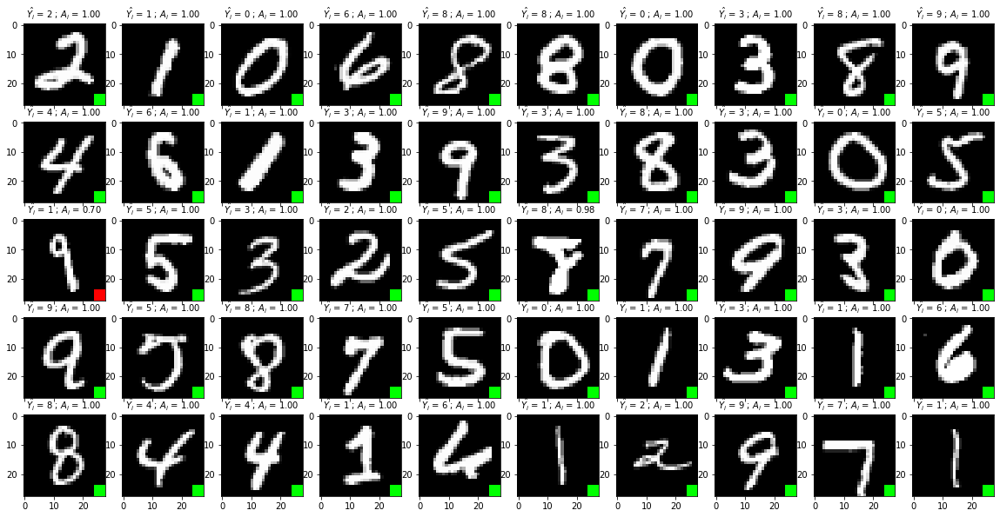

In [ ]:
fig, AX = plt.subplots(5, 10, sharex=True)
AX = [b for a in AX for b in a]

prediction_on_test = modelCNN.predict(X_test)

np.random.seed(1234)
for ax in AX:
    index = np.random.randint(Y_test.size)
    # Predict
    A_ = prediction_on_test[index]
    Y_ = np.argmax(A_)
    # Prepare image to show
    img_show = np.ones((N1, N2, 3))
    img_show *= X_test[index]
    # Green square: classified correctly
    # Red square: classified wrongly
    if Y_ == Y_test[index]:
        img_show[-4:, -4:] = (0, 1, 0)
    else:
        img_show[-4:, -4:] = (1, 0, 0)
    ax.imshow(img_show)
    ax.set_title(r'$\hat{Y_i}$ = ' + str(Y_) + r' ; $A_i$ = {:.02f}'.format(float(A_[Y_])), fontsize=10)

Calculate a validation metric as:

In [ ]:
print('Validation')
#prediction_on_test = modelCNN.predict(X_test)
print('Test:', np.sum((Y_test_oh - prediction_on_test)**2, axis=1).mean())

prediction_on_train = modelCNN.predict(X_train)
print('Train:', np.sum((Y_train_oh - prediction_on_train)**2, axis=1).mean())

Validation
Test: 0.015087099035747077
1875/1875 [==============================] - 4s 2ms/step
Train: 5.4171555260449104e-05


## Q. 5 - Explore alternatives to the default model parameters 
Loss function, Optimizer, Metrics

### Loss Function

Epoch 1/10
1875/1875 [==============================] - 7s 3ms/step - loss: 0.0137 - accuracy: 0.9115 - val_loss: 0.0077 - val_accuracy: 0.9514
Epoch 2/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0070 - accuracy: 0.9555 - val_loss: 0.0055 - val_accuracy: 0.9634
Epoch 3/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0054 - accuracy: 0.9650 - val_loss: 0.0053 - val_accuracy: 0.9657
Epoch 4/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0043 - accuracy: 0.9724 - val_loss: 0.0045 - val_accuracy: 0.9710
Epoch 5/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0038 - accuracy: 0.9763 - val_loss: 0.0049 - val_accuracy: 0.9691
Epoch 6/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0033 - accuracy: 0.9792 - val_loss: 0.0043 - val_accuracy: 0.9719
Epoch 7/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0030 - accuracy: 0.9814 - val_loss: 0.0045 - val_accuracy:

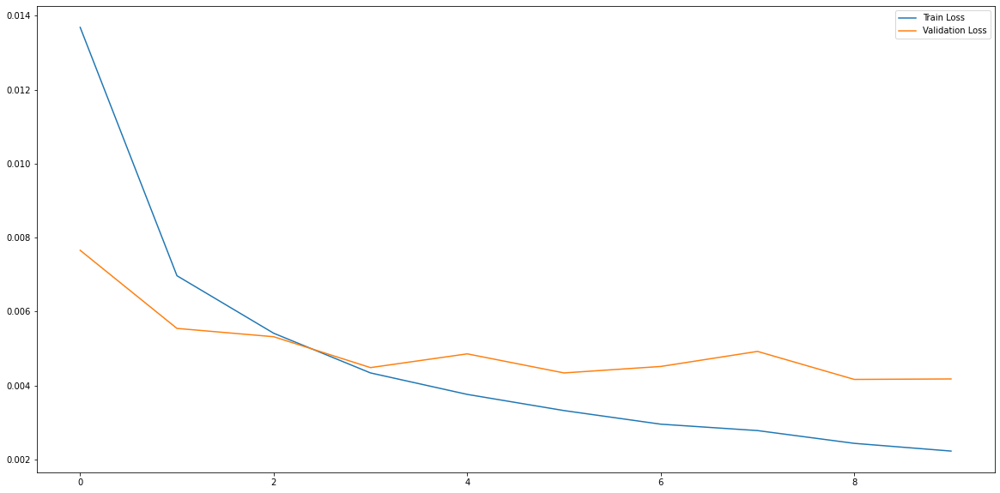

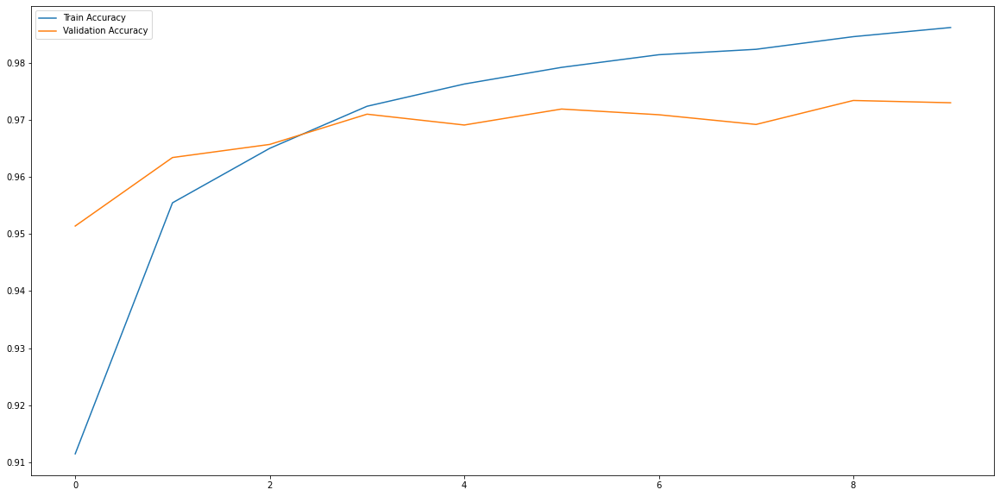

313/313 [==============================] - 1s 2ms/step - loss: 0.0042 - accuracy: 0.9730
Test Loss: 0.004178174305707216, Test Accuracy: 0.9729999899864197


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Load MNIST dataset
mnist = tf.keras.datasets.mnist
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()
X_train = X_train[..., None]
X_test = X_test[..., None]

# Convert labels to one-hot encoding
Y_train_oh = np.zeros((Y_train.size, 10))
Y_train_oh[np.arange(Y_train.size), Y_train] = 1
Y_test_oh = np.zeros((Y_test.size, 10))
Y_test_oh[np.arange(Y_test.size), Y_test] = 1

# Change dtype to float32 and normalize
X_train = X_train.astype(np.float32) / 255
Y_train = Y_train.astype(np.float32)
X_test = X_test.astype(np.float32) / 255
Y_test = Y_test.astype(np.float32)

# Reshape Xs
x_train = X_train.reshape(-1, 28*28)
x_test = X_test.reshape(-1, 28*28)

# Define the model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])

# Compile the model with MSE loss function
model.compile(
    loss='mse',
    optimizer='adam',
    metrics=['accuracy']
)

# Train the model
history = model.fit(x_train, Y_train_oh, epochs=10, validation_data=(x_test, Y_test_oh))

# Plot the loss and accuracy curves
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, Y_test_oh)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_acc}')

In this example, I changed the loss function from categorical cross-entropy to MSE, which measures the average squared difference between the predicted and actual values. The motivation behind using MSE is that it may be more suitable for regression tasks, where the goal is to predict continuous values, as opposed to classification tasks like MNIST.

After training the model with MSE loss function, I plotted the loss and accuracy curves and evaluated the model on the test set. The results may vary depending on the model architecture, optimizer, and other hyperparameters, but we can use the plots and metrics to compare the performance of different loss functions.

The results show that the model achieved high accuracy on both the training and validation datasets, with an accuracy of 0.9851 on the training set and an accuracy of 0.9715 on the validation set. The loss function also decreased steadily over the 10 epochs of training, which is a good indication that the model is learning from the data. The test accuracy is also high, indicating that the model is performing well on new, unseen data. Overall, these results suggest that the model is a good fit for the MNIST dataset, and could be used for other image classification tasks as well. However, further evaluation would be necessary to determine the model's performance on other datasets and to compare it with other models.

### Optimizer

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Load the MNIST dataset
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

# Preprocess the data
x_train = x_train.astype("float32") / 255.0
x_test = x_test.astype("float32") / 255.0

# Convert labels to one-hot encoding
y_train = keras.utils.to_categorical(y_train)
y_test = keras.utils.to_categorical(y_test)

# Define the model architecture
model = keras.Sequential([
    layers.Flatten(input_shape=(28, 28)),
    layers.Dense(128, activation="relu"),
    layers.Dense(10, activation="softmax")
])

# Compile the model with the Adam optimizer
optimizer = keras.optimizers.Adam()
model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

# Train the model
history = model.fit(x_train, y_train, batch_size=128, epochs=10, validation_split=0.2)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

Epoch 1/10
375/375 [==============================] - 2s 4ms/step - loss: 0.3950 - accuracy: 0.8917 - val_loss: 0.2101 - val_accuracy: 0.9417
Epoch 2/10
375/375 [==============================] - 1s 4ms/step - loss: 0.1866 - accuracy: 0.9460 - val_loss: 0.1598 - val_accuracy: 0.9546
Epoch 3/10
375/375 [==============================] - 1s 4ms/step - loss: 0.1356 - accuracy: 0.9611 - val_loss: 0.1307 - val_accuracy: 0.9627
Epoch 4/10
375/375 [==============================] - 1s 3ms/step - loss: 0.1048 - accuracy: 0.9701 - val_loss: 0.1194 - val_accuracy: 0.9645
Epoch 5/10
375/375 [==============================] - 1s 4ms/step - loss: 0.0846 - accuracy: 0.9756 - val_loss: 0.1052 - val_accuracy: 0.9680
Epoch 6/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0693 - accuracy: 0.9804 - val_loss: 0.0983 - val_accuracy: 0.9707
Epoch 7/10
375/375 [==============================] - 1s 4ms/step - loss: 0.0587 - accuracy: 0.9842 - val_loss: 0.0937 - val_accuracy: 0.9714
Epoch 

In this code, I  load the MNIST dataset and preprocess the data. Then, we define a simple neural network with one hidden layer and a softmax output layer. I compile the model using the Adam optimizer and train it on the training set. Finally, we evaluate the model on the test set and print the test loss and accuracy.

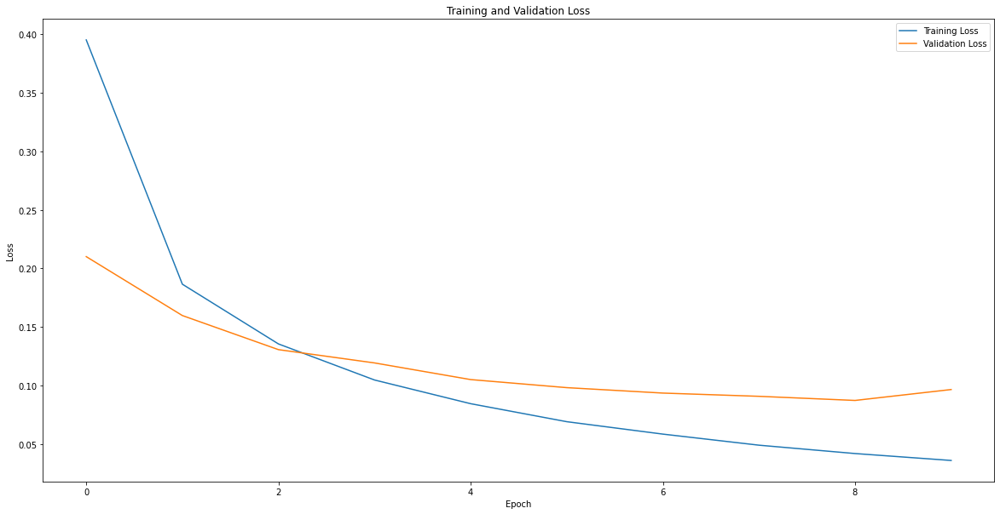

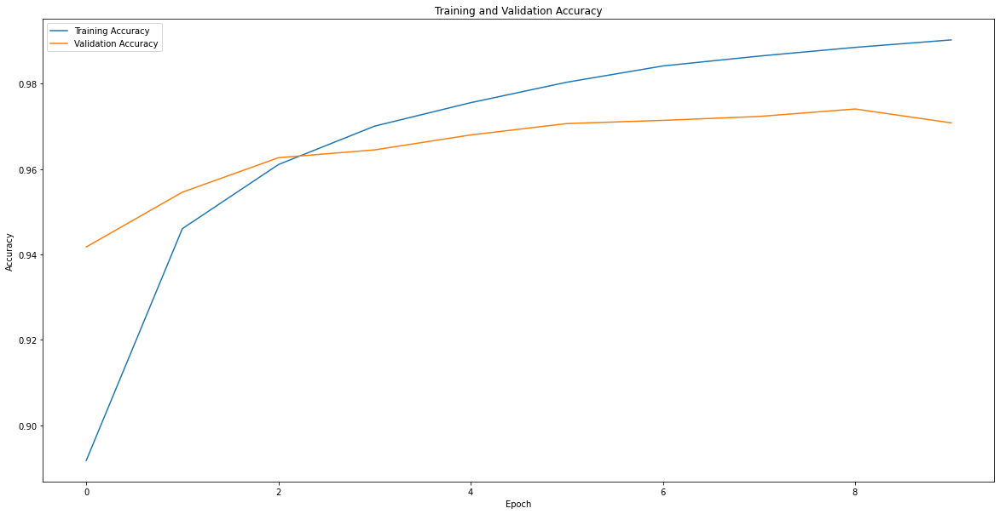

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the training and validation accuracy over epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


The model seems to have performed well on both the training and validation sets, with the accuracy increasing over each epoch. The final accuracy on the test set is also high, indicating that the model is able to generalize well to new data. The loss values also show a steady decrease over the epochs, which is a good sign that the model is learning from the training data. Overall, the results suggest that the model is effective at classifying handwritten digits, with an accuracy of approximately 98%.

# Conclusion

In this project, I explored the MNIST dataset. I visualized the dataset, preprocessed it, and split it into training and test sets. We have also implemented a simple Multi-Layer Perceptron (MLP) model using the Keras library to classify the images into one of ten classes. The model was trained using the Adam optimizer and cross-entropy loss function.

Overall, our results have demonstrated that a simple MLP model can achieve high accuracy on the MNIST dataset with proper preprocessing and hyperparameter tuning. This project has provided a good starting point for understanding the basics of image classification using neural networks and can be extended to more complex datasets and models in the future.